# Introduction

Basketball is one of America's favorite sports. Many people root for their favorite team, hoping their favorite team is going to win. But what if we can create a model that can objectively predict the winner of a basketball game? I have scraped many websites gathering data for every game of the 2017 through 2019 NBA seasons. Using this data I would like to answer the question...

Can we use unsupervised methods to cluster winner and loser of a basketball game?
Let's dive into the data and find out!

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import umap
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.mixture import GaussianMixture
from sklearn.neural_network import MLPClassifier, BernoulliRBM
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import ExtraTreesClassifier
from xgboost import XGBClassifier
from vecstack import stacking
from sklearn.metrics import accuracy_score
from scipy.stats import ttest_ind

In [2]:
df = pd.read_csv('NBA_game_stats.csv')

In [3]:
df.head()

,game_date,home_team,away_team,home_team_total,away_team_total,home_team_ML,away_team_ML,home_team_spread,away_team_spread,home_team_off_eff,...,home_team_pct_3point,away_team_pct_3point,home_team_pct_3point_last3,away_team_pct_3point_last3,home_team_pct_3point_last1,away_team_pct_3point_last1,home_team_pct_3point_prevYear,away_team_pct_3point_prevYear,home_team_home_pct_3point,away_team_away_pct_3point
0,2016-10-26,INDIANA,DALLAS,130,106,-225.0,201.0,-5½,+5½,--,...,--,--,--,--,--,--,35.3,34.2,--,--
1,2016-10-26,ORLANDO,MIAMI,96,108,-152.0,137.0,-3,+3,--,...,--,--,--,--,--,--,35.0,34.0,--,--
2,2016-10-26,BOSTON,BROOKLYN,122,117,-951.0,737.0,-11½,+11½,--,...,--,--,--,--,--,--,33.0,35.2,--,--
3,2016-10-26,TORONTO,DETROIT,109,91,-270.0,239.0,-6½,+6½,--,...,--,--,--,--,--,--,35.6,34.6,--,--
4,2016-10-26,PHILADELPHIA,OKLAHOMA CITY,97,103,371.0,-432.0,+9,-9,--,...,--,--,--,--,--,--,33.9,34.6,--,--


In [4]:
# convert date to datetime

df['game_date'] = pd.to_datetime(df['game_date'])

In [5]:
# Creating column which identifies which season the match is being played
def season(s):
    if s['game_date'] > pd.to_datetime('2016-10-01') and s['game_date'] < pd.to_datetime('2017-05-01'):
        return '2016-2017'
    
    if s['game_date'] > pd.to_datetime('2017-10-01') and s['game_date'] < pd.to_datetime('2018-05-01'):
        return '2017-2018'
    
    if s['game_date'] > pd.to_datetime('2018-10-01') and s['game_date'] < pd.to_datetime('2019-05-01'):
        return '2018-2019'

df['season'] = df.apply(season, axis=1)

In [6]:
df.describe()

,home_team_total,away_team_total,home_team_ML,away_team_ML,home_team_off_eff_prevYear,away_team_off_eff_prevYear,home_team_def_eff_prevYear,away_team_def_eff_prevYear,home_team_tot_reb_prevYear,away_team_tot_reb_prevYear,home_team_opp_tot_reb_prevYear,away_team_opp_tot_reb_prevYear,home_team_pct_3point_prevYear,away_team_pct_3point_prevYear
count,3682.000000,3682.000000,3342.000000,3343.000000,3682.000000,3682.000000,3682.000000,3682.000000,3682.000000,3682.000000,3682.000000,3682.000000,3682.000000,3682.000000
mean,108.584465,105.871537,-204.938061,126.158241,1.044764,1.044831,1.047242,1.047234,51.685633,51.689489,51.730337,51.733270,35.644215,35.648072
std,12.501369,12.520825,541.451417,387.226808,0.032188,0.032219,0.026212,0.026173,2.058289,2.058606,1.924252,1.922888,1.575900,1.578915
min,61.000000,63.000000,-7000.000000,-2586.000000,0.958000,0.958000,0.964000,0.964000,44.900000,44.900000,47.900000,47.900000,31.700000,31.700000
25%,100.000000,97.000000,-312.000000,-138.000000,1.022000,1.022000,1.030000,1.030000,50.000000,50.000000,50.400000,50.400000,34.600000,34.600000
50%,108.000000,106.000000,-161.000000,145.000000,1.040000,1.040000,1.051000,1.051000,51.600000,51.600000,51.600000,51.600000,35.600000,35.600000
75%,117.000000,114.000000,125.000000,273.500000,1.064000,1.064000,1.069000,1.069000,53.100000,53.100000,53.100000,53.100000,36.800000,36.800000
max,154.000000,149.000000,1523.000000,2499.000000,1.125000,1.125000,1.095000,1.095000,56.800000,56.800000,56.100000,56.100000,41.000000,41.000000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3682 entries, 0 to 3681
Data columns (total 60 columns):
game_date                         3682 non-null datetime64[ns]
home_team                         3682 non-null object
away_team                         3682 non-null object
home_team_total                   3682 non-null int64
away_team_total                   3682 non-null int64
home_team_ML                      3342 non-null float64
away_team_ML                      3343 non-null float64
home_team_spread                  3682 non-null object
away_team_spread                  3682 non-null object
home_team_off_eff                 3682 non-null object
away_team_off_eff                 3682 non-null object
home_team_off_eff_last3           3682 non-null object
away_team_off_eff_last3           3682 non-null object
home_team_off_eff_last1           3682 non-null object
away_team_off_eff_last1           3682 non-null object
home_team_off_eff_prevYear        3682 non-null float64
away

## Unusual values

In [8]:
# check for unusual values
print(sorted(df['home_team_pct_3point_last1'].unique()))

['--', '10.0', '10.7', '11.1', '11.5', '11.8', '11.9', '12.0', '12.5', '12.9', '13.0', '13.3', '13.6', '14.3', '14.7', '14.8', '15.0', '15.2', '15.4', '15.6', '15.8', '16.0', '16.1', '16.7', '17.1', '17.2', '17.4', '17.6', '17.9', '18.2', '18.4', '18.5', '18.8', '19.0', '19.2', '19.4', '19.5', '19.6', '20.0', '20.6', '20.7', '20.8', '21.1', '21.2', '21.3', '21.4', '21.6', '21.7', '21.9', '22.0', '22.2', '22.5', '22.6', '22.7', '22.9', '23.1', '23.3', '23.4', '23.5', '23.7', '23.8', '24.0', '24.1', '24.2', '24.3', '24.4', '25.0', '25.5', '25.6', '25.7', '25.8', '25.9', '26.1', '26.2', '26.3', '26.5', '26.7', '26.8', '26.9', '27.0', '27.3', '27.5', '27.6', '27.8', '27.9', '28.0', '28.1', '28.2', '28.3', '28.6', '28.8', '28.9', '29.0', '29.2', '29.3', '29.4', '29.5', '29.6', '29.7', '30.0', '30.2', '30.3', '30.4', '30.6', '30.8', '31.0', '31.1', '31.2', '31.4', '31.6', '31.7', '31.8', '31.9', '32.0', '32.1', '32.3', '32.4', '32.5', '32.6', '32.9', '33.3', '34.0', '34.1', '34.2', '34.3', '

- There should not be a % sign after some values.<br>
- The '--' value is what is used when it is a team first game of the season, and there is no information available. I will delete these rows for the baseline model.

In [9]:
# Lets get rid of the % sign after some values

df['home_team_pct_3point_last1'] = [x[:-1] if x[-1] == '%' else x for x in df['home_team_pct_3point_last1']]
df['away_team_pct_3point_last1'] = [x[:-1] if x[-1] == '%' else x for x in df['away_team_pct_3point_last1']]
df['away_team_away_pct_3point'] = [x[:-1] if x[-1] == '%' else x for x in df['away_team_away_pct_3point']]

In [10]:
# check for unusual values
print(sorted(df['home_team_off_eff'].unique()))

['--', '0.724', '0.796', '0.809', '0.818', '0.844', '0.845', '0.887', '0.889', '0.894', '0.909', '0.910', '0.915', '0.918', '0.919', '0.920', '0.921', '0.925', '0.927', '0.928', '0.931', '0.932', '0.933', '0.938', '0.939', '0.940', '0.941', '0.942', '0.943', '0.944', '0.945', '0.946', '0.948', '0.949', '0.950', '0.951', '0.952', '0.953', '0.954', '0.955', '0.956', '0.958', '0.960', '0.961', '0.962', '0.963', '0.964', '0.965', '0.966', '0.967', '0.968', '0.969', '0.970', '0.971', '0.972', '0.973', '0.974', '0.975', '0.976', '0.977', '0.978', '0.979', '0.980', '0.981', '0.982', '0.983', '0.984', '0.985', '0.986', '0.987', '0.988', '0.989', '0.990', '0.991', '0.992', '0.993', '0.994', '0.995', '0.996', '0.997', '0.998', '0.999', '1.000', '1.001', '1.002', '1.003', '1.004', '1.005', '1.006', '1.007', '1.008', '1.009', '1.010', '1.011', '1.012', '1.013', '1.014', '1.015', '1.016', '1.017', '1.018', '1.019', '1.020', '1.021', '1.022', '1.023', '1.024', '1.025', '1.026', '1.027', '1.028', '1.

In [11]:
len(df)

3682

In [12]:
# deleting rows with '--'.
# These rows are from the first games of the season so there is not any data available yet.
cols = ['home_team_off_eff', 'away_team_off_eff', 'home_team_off_eff_last3', 'away_team_off_eff_last3',
        'home_team_off_eff_last1', 'away_team_off_eff_last1', 'home_team_def_eff', 'away_team_def_eff',
        'home_team_def_eff_last3', 'away_team_def_eff_last3', 'home_team_def_eff_last1', 'away_team_def_eff_last1',
        'home_team_tot_reb', 'away_team_tot_reb', 'home_team_tot_reb_last3', 'away_team_tot_reb_last3', 
        'home_team_tot_reb_last1', 'away_team_tot_reb_last1', 'home_team_opp_tot_reb', 'away_team_opp_tot_reb',
        'home_team_opp_tot_reb_last3', 'away_team_opp_tot_reb_last3', 'home_team_opp_tot_reb_last1',
        'away_team_opp_tot_reb_last1', 'home_team_pct_3point', 'away_team_pct_3point', 'home_team_pct_3point_last3',
        'away_team_pct_3point_last3', 'home_team_pct_3point_last1', 'away_team_pct_3point_last1']


for col in cols:
    index_names = df[df[col] == '--'].index
    df.drop(index_names, inplace=True)
    df[col] = df[col].apply(float)

In [13]:
# dealing with rows with '--'
cols = ['home_team_home_off_eff', 'away_team_away_off_eff', 'home_team_home_def_eff', 'away_team_away_def_eff',
        'home_team_home_tot_reb', 'away_team_away_tot_reb', 'home_team_home_opp_tot_reb', 'away_team_away_opp_tot_reb',
        'home_team_home_pct_3point', 'away_team_away_pct_3point']

for col in cols:
    def replace(s):
        if s[col] == '--':
            return 0
        else:
            return s[col]
    
    df[col] = df.apply(replace, axis=1)
    df[col] = df[col].apply(float)

In [14]:
# check for unusual values
print(df['home_team_spread'].unique())

['+8' '+2½' '-4' '+6' '-8' '+1' '+1½' '-9½' '+12' '+3' '-2' '-11' '-13½'
 '-6½' '-3½' '-1½' '-7½' '+6½' '+11½' '-8½' '+3½' '-4½' '-7' '-12' '-9'
 '+5' '+5½' '-1' '-13' '+4' '-5' '-3' '-10½' '-2½' '+2' '+12½' '-5½' '-17'
 '+4½' '-11½' '-18' '+7½' '-15' '-10' '-16½' '-6' '+7' '-12½' '+8½' '+9'
 '+14½' '+10½' '+9½' '+14' '+11' '-14' '+10' '+13' '-15½' '-14½' '+13½'
 '--' '-18½' '-16' '-19' '-21' '-17½' '+17' 'PK-105']


- values ending with ½ should end with .5
- values with 'PK' should be 0
- The '--' value is unknown. I will change these values to NaN, and deal with these missing values later.

In [15]:
# Fixing all the unusual values
df['home_team_spread'] = [x if x[-1] != '½' else x[:-1] + '.5' for x in df['home_team_spread']]
df['home_team_spread'] = [x if x[:2] != 'PK' else '0' for x in df['home_team_spread']]
df['home_team_spread'] = [x if x != '--' else float('nan') for x in df['home_team_spread']]
df['away_team_spread'] = [x if x[-1] != '½' else x[:-1] + '.5' for x in df['away_team_spread']]
df['away_team_spread'] = [x if x[:2] != 'PK' else '0' for x in df['away_team_spread']]
df['away_team_spread'] = [x if x != '--' else float('nan') for x in df['away_team_spread']]

In [16]:
# convert spread from string to float
df['home_team_spread'] = df['home_team_spread'].apply(float)
df['away_team_spread'] = df['away_team_spread'].apply(float)

In [17]:
home_team_spread_dic = {}

for team in df['home_team'].unique():
    for season in df['season'].unique():
        home_team_spread_dic[team + '_' + season] = df.groupby(['home_team', 'season']).mean().loc[(team, season), 'home_team_spread']      

away_team_spread_dic = {}

for team in df['away_team'].unique():
    for season in df['season'].unique():
        away_team_spread_dic[team + '_' + season] = df.groupby(['away_team', 'season']).mean().loc[(team, season), 'away_team_spread']   

In [18]:
# filled in missing values for home_team_spread
# I used the weighted average of home spread for the home team for the specific season
# with the average away spread of the home teams' opponent

for index in df.index:
    home_team = df.loc[index, 'home_team']
    away_team = df.loc[index, 'away_team']
    season = df.loc[index, 'season']
    if np.isnan(df.loc[index, 'home_team_spread']):
        if home_team_spread_dic[home_team + '_' + season] < away_team_spread_dic[away_team + '_' + season]:
            df.loc[index, 'home_team_spread'] = .5*(home_team_spread_dic[home_team + '_' + season] - away_team_spread_dic[away_team + '_' + season])
        if home_team_spread_dic[home_team + '_' + season] > away_team_spread_dic[away_team + '_' + season]:
            df.loc[index, 'home_team_spread'] = .5*(home_team_spread_dic[home_team + '_' + season] + away_team_spread_dic[away_team + '_' + season])

In [19]:
# The spread must be rounded to the nearst .5
def rounding(s):
    return round(s['home_team_spread']/.5)*.5

df['home_team_spread'] = df.apply(rounding, axis=1)

df['away_team_spread'] = -df['home_team_spread']

In [20]:
# Filling in missing values for home_team_ML
for index in df.index:
    home_team_spread = df.loc[index, 'home_team_spread']
    if np.isnan(df.loc[index, 'home_team_ML']):
        df.loc[index, 'home_team_ML'] = df[df['home_team_spread'] == home_team_spread]['home_team_ML'].median()

In [21]:
# Filling in missing values for away_team_ML
for index in df.index:
    away_team_spread = df.loc[index, 'away_team_spread']
    if np.isnan(df.loc[index, 'away_team_ML']):
        df.loc[index, 'away_team_ML'] = df[df['away_team_spread'] == away_team_spread]['away_team_ML'].median()

### More unusual values

In [22]:
# Check if game ends in a tie.

df[df['home_team_total'] == df['away_team_total']]

,game_date,home_team,away_team,home_team_total,away_team_total,home_team_ML,away_team_ML,home_team_spread,away_team_spread,home_team_off_eff,...,away_team_pct_3point,home_team_pct_3point_last3,away_team_pct_3point_last3,home_team_pct_3point_last1,away_team_pct_3point_last1,home_team_pct_3point_prevYear,away_team_pct_3point_prevYear,home_team_home_pct_3point,away_team_away_pct_3point,season
560,2017-01-08,PORTLAND,DETROIT,102,102,-164.0,148.0,-3.5,3.5,1.059,...,34.2,37.0,36.7,36.4,35.7,37.1,34.6,37.5,32.3,2016-2017
1646,2017-12-15,PHILADELPHIA,OKLAHOMA CITY,63,63,-113.0,102.0,-1.0,1.0,1.035,...,34.2,35.2,38.2,42.3,44.8,34.0,32.6,33.5,35.2,2017-2018
2192,2018-03-07,DETROIT,TORONTO,101,101,165.0,-183.0,4.5,-4.5,1.035,...,35.4,35.6,29.1,35.3,27.8,33.0,36.0,37.6,35.4,2017-2018


In [23]:
# An NBA game can never end in a tie. I will manually fix these rows.
df.loc[560, 'home_team_total'], df.loc[560, 'away_team_total'] = 124, 125
df.loc[1646, 'home_team_total'], df.loc[1646, 'away_team_total'] = 117, 119
df.loc[2192, 'home_team_total'], df.loc[2192, 'away_team_total'] = 119, 121

# missing values

In [24]:
# Percentage of missing values in each column.
df.isnull().sum()/df.isnull().count()

game_date                         0.000000
home_team                         0.000000
away_team                         0.000000
home_team_total                   0.000000
away_team_total                   0.000000
home_team_ML                      0.000825
away_team_ML                      0.000825
home_team_spread                  0.000000
away_team_spread                  0.000000
home_team_off_eff                 0.000000
away_team_off_eff                 0.000000
home_team_off_eff_last3           0.000000
away_team_off_eff_last3           0.000000
home_team_off_eff_last1           0.000000
away_team_off_eff_last1           0.000000
home_team_off_eff_prevYear        0.000000
away_team_off_eff_prevYear        0.000000
home_team_home_off_eff            0.000000
away_team_away_off_eff            0.000000
home_team_def_eff                 0.000000
away_team_def_eff                 0.000000
home_team_def_eff_last3           0.000000
away_team_def_eff_last3           0.000000
home_team_d

There are only 3 rows (.08%) with missing values. I will drop these rows.

In [25]:
df.dropna(inplace=True)

# Creating our target

Our goal is to cluster the data into two groups (winners and losers). I will classify the home team winning as 0, and the away team winning as 1.

In [26]:
# defining a winner function
def winner(s):
    # if home team wins return 0
    if s['home_team_total'] > s['away_team_total']:
        return int(0)
    # if away team wins return 1
    if s['home_team_total'] < s['away_team_total']:
        return int(1)

# applying our winner function to create winner column
df['winner'] = df.apply(winner, axis=1)

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3634 entries, 12 to 3681
Data columns (total 61 columns):
game_date                         3634 non-null datetime64[ns]
home_team                         3634 non-null object
away_team                         3634 non-null object
home_team_total                   3634 non-null int64
away_team_total                   3634 non-null int64
home_team_ML                      3634 non-null float64
away_team_ML                      3634 non-null float64
home_team_spread                  3634 non-null float64
away_team_spread                  3634 non-null float64
home_team_off_eff                 3634 non-null float64
away_team_off_eff                 3634 non-null float64
home_team_off_eff_last3           3634 non-null float64
away_team_off_eff_last3           3634 non-null float64
home_team_off_eff_last1           3634 non-null float64
away_team_off_eff_last1           3634 non-null float64
home_team_off_eff_prevYear        3634 non-null flo

//anaconda3/lib/python3.7/site-packages/pandas/core/ops/__init__.py:1115: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  result = method(y)


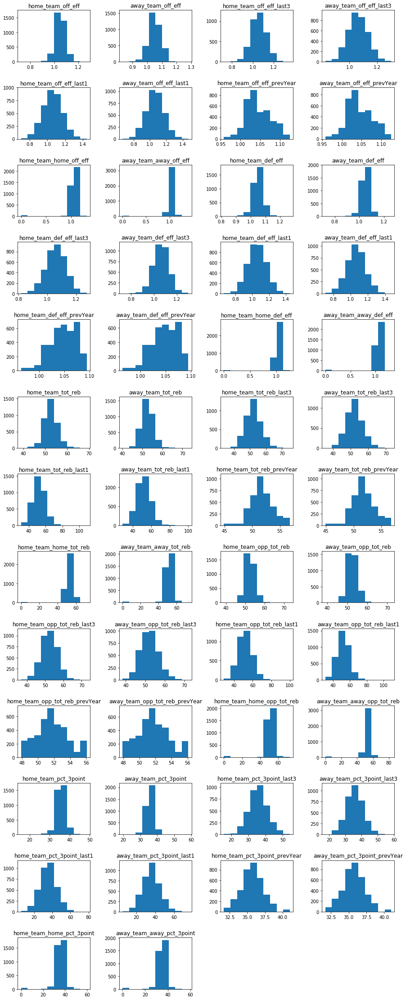

In [28]:
cols = ['home_team_off_eff', 'away_team_off_eff', 'home_team_off_eff_last3', 'away_team_off_eff_last3',
       'home_team_off_eff_last1', 'away_team_off_eff_last1', 'home_team_off_eff_prevYear',
       'away_team_off_eff_prevYear', 'home_team_home_off_eff', 'away_team_away_off_eff', 'home_team_def_eff',
       'away_team_def_eff', 'home_team_def_eff_last3', 'away_team_def_eff_last3', 'home_team_def_eff_last1',
       'away_team_def_eff_last1', 'home_team_def_eff_prevYear', 'away_team_def_eff_prevYear', 'home_team_home_def_eff',
       'away_team_away_def_eff', 'home_team_tot_reb', 'away_team_tot_reb', 'home_team_tot_reb_last3',
       'away_team_tot_reb_last3', 'home_team_tot_reb_last1', 'away_team_tot_reb_last1', 'home_team_tot_reb_prevYear',
       'away_team_tot_reb_prevYear', 'home_team_home_tot_reb', 'away_team_away_tot_reb', 'home_team_opp_tot_reb',
       'away_team_opp_tot_reb', 'home_team_opp_tot_reb_last3', 'away_team_opp_tot_reb_last3',
       'home_team_opp_tot_reb_last1', 'away_team_opp_tot_reb_last1',
       'home_team_opp_tot_reb_prevYear', 'away_team_opp_tot_reb_prevYear', 'home_team_home_opp_tot_reb',
       'away_team_away_opp_tot_reb', 'home_team_pct_3point', 'away_team_pct_3point', 'home_team_pct_3point_last3',
       'away_team_pct_3point_last3', 'home_team_pct_3point_last1', 'away_team_pct_3point_last1',
       'home_team_pct_3point_prevYear', 'away_team_pct_3point_prevYear',
       'home_team_home_pct_3point', 'away_team_away_pct_3point']


plt.figure(figsize=(15,40))
plt.subplots_adjust(wspace=.4, hspace=.5)

i = 1
for col in cols:
    plt.subplot(13,4,i)
    plt.hist(df[df[col] != '--'][col])
    plt.title(col, fontsize=12)
    i += 1

plt.show()

# Feature engineering

In [29]:
df['off_eff_diff'] = df['home_team_off_eff'] - df['away_team_off_eff']
df['off_eff_last3_diff'] = df['home_team_off_eff_last3'] - df['away_team_off_eff_last3']
df['off_eff_last1_diff'] = df['home_team_off_eff_last1'] - df['away_team_off_eff_last1']
df['off_eff_home_away_diff'] = df['home_team_home_off_eff'] - df['away_team_away_off_eff']
df['off_eff_prevYear_diff'] = df['home_team_off_eff_prevYear'] - df['away_team_off_eff_prevYear']

In [30]:
df['def_eff_diff'] = df['home_team_def_eff'] - df['away_team_def_eff']
df['def_eff_last3_diff'] = df['home_team_def_eff_last3'] - df['away_team_def_eff_last3']
df['def_eff_last1_diff'] = df['home_team_def_eff_last1'] - df['away_team_def_eff_last1']
df['def_eff_home_away_diff'] = df['home_team_home_def_eff'] - df['away_team_away_def_eff']
df['def_eff_prevYear_diff'] = df['home_team_def_eff_prevYear'] - df['away_team_def_eff_prevYear']

In [31]:
df['pct_3point_diff'] = df['home_team_pct_3point'] - df['away_team_pct_3point']
df['pct_3point_last3_diff'] = df['home_team_pct_3point_last3'] - df['away_team_pct_3point_last3']
df['pct_3point_last1_diff'] = df['home_team_pct_3point_last1'] - df['away_team_pct_3point_last1']
df['pct_3point_home_away_diff'] = df['home_team_home_pct_3point'] - df['away_team_away_pct_3point']
df['pct_3point_prevYear_diff'] = df['home_team_pct_3point_prevYear'] - df['away_team_pct_3point_prevYear']

In [32]:
df['home_team_reb_diff'] = df['home_team_tot_reb'] - df['home_team_opp_tot_reb']
df['home_team_reb_diff_last3'] = df['home_team_tot_reb_last3'] - df['home_team_opp_tot_reb_last3']
df['home_team_reb_diff_last1'] = df['home_team_tot_reb_last1'] - df['home_team_opp_tot_reb_last1']
df['home_team_home_reb_diff'] = df['home_team_home_tot_reb'] - df['home_team_home_opp_tot_reb']
df['home_team_reb_prevYear_diff'] = df['home_team_tot_reb_prevYear'] - df['home_team_opp_tot_reb_prevYear']

In [33]:
df['away_team_reb_diff'] = df['away_team_tot_reb'] - df['away_team_opp_tot_reb']
df['away_team_reb_diff_last3'] = df['away_team_tot_reb_last3'] - df['away_team_opp_tot_reb_last3']
df['away_team_reb_diff_last1'] = df['away_team_tot_reb_last1'] - df['away_team_opp_tot_reb_last1']
df['away_team_away_reb_diff'] = df['away_team_away_tot_reb'] - df['away_team_away_opp_tot_reb']
df['away_team_reb_prevYear_diff'] = df['away_team_tot_reb_prevYear'] - df['away_team_opp_tot_reb_prevYear']

In [34]:
df['reb_diff'] = df['home_team_reb_diff'] - df['away_team_reb_diff']
df['reb_diff_last3'] = df['home_team_reb_diff_last3'] - df['away_team_reb_diff_last3']
df['reb_diff_last1'] = df['home_team_reb_diff_last1'] - df['away_team_reb_diff_last1']
df['reb_diff_home_away'] = df['home_team_home_reb_diff'] - df['away_team_away_reb_diff']
df['reb_diff_prevYear'] = df['home_team_reb_prevYear_diff'] - df['away_team_reb_prevYear_diff']

In [35]:
df['home_team_eff_diff'] = df['home_team_off_eff'] - df['home_team_def_eff']
df['home_team_eff_diff_last3'] = df['home_team_off_eff_last3'] - df['home_team_def_eff_last3']
df['home_team_eff_diff_last1'] = df['home_team_off_eff_last1'] - df['home_team_def_eff_last1']
df['home_team_home_eff_diff'] = df['home_team_home_off_eff'] - df['home_team_home_def_eff']
df['home_team_eff_diff_prevYear'] = df['home_team_off_eff_prevYear'] - df['home_team_def_eff_prevYear']

In [36]:
df['away_team_eff_diff'] = df['away_team_off_eff'] - df['away_team_def_eff']
df['away_team_eff_diff_last3'] = df['away_team_off_eff_last3'] - df['away_team_def_eff_last3']
df['away_team_eff_diff_last1'] = df['away_team_off_eff_last1'] - df['away_team_def_eff_last1']
df['away_team_away_eff_diff'] = df['away_team_away_off_eff'] - df['away_team_away_def_eff']
df['away_team_eff_diff_prevYear'] = df['away_team_off_eff_prevYear'] - df['away_team_def_eff_prevYear']

In [37]:
df['total_eff_diff'] = df['home_team_eff_diff'] - df['away_team_eff_diff']
df['total_eff_diff_last3'] = df['home_team_eff_diff_last3'] - df['away_team_eff_diff_last3']
df['total_eff_diff_last1'] = df['home_team_eff_diff_last1'] - df['away_team_eff_diff_last1']
df['total_home_away_eff_diff'] = df['home_team_home_eff_diff'] - df['away_team_away_eff_diff']
df['total_eff_diff_prevYear'] = df['home_team_eff_diff_prevYear'] - df['away_team_eff_diff_prevYear']

In [38]:
pd.set_option('max_rows', 105)
pd.set_option('max_columns', 87)
df.corr()

,home_team_total,away_team_total,home_team_ML,away_team_ML,home_team_spread,away_team_spread,home_team_off_eff,away_team_off_eff,home_team_off_eff_last3,away_team_off_eff_last3,home_team_off_eff_last1,away_team_off_eff_last1,home_team_off_eff_prevYear,away_team_off_eff_prevYear,home_team_home_off_eff,away_team_away_off_eff,home_team_def_eff,away_team_def_eff,home_team_def_eff_last3,away_team_def_eff_last3,home_team_def_eff_last1,away_team_def_eff_last1,home_team_def_eff_prevYear,away_team_def_eff_prevYear,home_team_home_def_eff,away_team_away_def_eff,home_team_tot_reb,away_team_tot_reb,home_team_tot_reb_last3,away_team_tot_reb_last3,home_team_tot_reb_last1,away_team_tot_reb_last1,home_team_tot_reb_prevYear,away_team_tot_reb_prevYear,home_team_home_tot_reb,away_team_away_tot_reb,home_team_opp_tot_reb,away_team_opp_tot_reb,home_team_opp_tot_reb_last3,away_team_opp_tot_reb_last3,home_team_opp_tot_reb_last1,away_team_opp_tot_reb_last1,home_team_opp_tot_reb_prevYear,...,off_eff_last1_diff,off_eff_home_away_diff,off_eff_prevYear_diff,def_eff_diff,def_eff_last3_diff,def_eff_last1_diff,def_eff_home_away_diff,def_eff_prevYear_diff,pct_3point_diff,pct_3point_last3_diff,pct_3point_last1_diff,pct_3point_home_away_diff,pct_3point_prevYear_diff,home_team_reb_diff,home_team_reb_diff_last3,home_team_reb_diff_last1,home_team_home_reb_diff,home_team_reb_prevYear_diff,away_team_reb_diff,away_team_reb_diff_last3,away_team_reb_diff_last1,away_team_away_reb_diff,away_team_reb_prevYear_diff,reb_diff,reb_diff_last3,reb_diff_last1,reb_diff_home_away,reb_diff_prevYear,home_team_eff_diff,home_team_eff_diff_last3,home_team_eff_diff_last1,home_team_home_eff_diff,home_team_eff_diff_prevYear,away_team_eff_diff,away_team_eff_diff_last3,away_team_eff_diff_last1,away_team_away_eff_diff,away_team_eff_diff_prevYear,total_eff_diff,total_eff_diff_last3,total_eff_diff_last1,total_home_away_eff_diff,total_eff_diff_prevYear
home_team_total,1.000000,0.324374,-0.242310,0.261238,-0.264949,0.264949,0.264991,0.021862,0.205699,0.037553,0.111228,0.014545,0.198787,-0.024546,0.089955,0.012644,0.039080,0.206601,0.012437,0.142026,0.029124,0.075916,-0.010943,0.190561,0.016157,0.063475,0.139501,0.078812,0.109034,0.060502,0.062904,0.048447,0.062565,0.040300,0.057429,0.045363,0.037011,0.177303,0.018874,0.130053,0.019277,0.086290,-0.027088,...,0.068678,0.075358,0.165920,-0.125880,-0.090765,-0.032236,-0.047067,-0.154492,0.070550,0.061752,0.042757,0.035744,0.113588,0.087602,0.071139,0.032322,0.082188,0.064877,-0.055492,-0.049065,-0.028318,-0.044902,-0.004408,0.102082,0.084705,0.042794,0.090833,0.048187,0.175181,0.149521,0.062639,0.151635,0.152650,-0.122286,-0.078733,-0.047859,-0.108186,-0.131619,0.213602,0.161383,0.078379,0.186055,0.196741
away_team_total,0.324374,1.000000,0.165717,-0.211524,0.233045,-0.233045,0.028067,0.213732,0.037217,0.156678,0.031855,0.108588,-0.012631,0.162798,0.019603,0.064564,0.207855,0.053422,0.132162,0.054546,0.102844,0.037824,0.178076,0.026818,0.072716,0.012501,0.088153,0.133572,0.057422,0.091080,0.034201,0.058624,0.036544,0.039211,0.052387,0.064802,0.183641,0.083167,0.109999,0.074957,0.073333,0.049407,0.079349,...,-0.054808,-0.042325,-0.130832,0.116455,0.056528,0.047050,0.057510,0.116326,-0.050983,-0.023718,-0.012865,-0.025499,-0.093122,-0.050867,-0.033686,-0.028141,-0.041762,-0.027806,0.050332,0.014303,0.006304,0.041406,0.029040,-0.072187,-0.033846,-0.024314,-0.058764,-0.039521,-0.116756,-0.071201,-0.055409,-0.103083,-0.116164,0.126141,0.082842,0.056482,0.108817,0.103698,-0.174151,-0.108231,-0.079196,-0.151014,-0.152171
home_team_ML,-0.242310,0.165717,1.000000,-0.935575,0.793350,-0.793350,-0.392005,0.345727,-0.271421,0.212196,-0.167581,0.146288,-0.357686,0.311610,-0.133506,0.105975,0.244916,-0.221438,0.158657,-0.125867,0.108356,-0.065673,0.300503,-0.242350,0.057072,-0.066979,-0.069319,0.093540,-0.060220,0.053210,-0.047331,0.020307,-0.077952,0.041653,-0.017164,0.051118,0.170437,-0.169104,0.104620,-0.123188,0.058473,-0.080355,0.080202,...,-0.223440,-0.230404

Many features are showing strong intercorrelation. Let's use PCA to handle the intercorrelation.

# Feature PCA

In [39]:
X = df[['home_team_off_eff', 'away_team_off_eff', 'home_team_off_eff_last3', 'away_team_off_eff_last3',
       'home_team_off_eff_last1', 'away_team_off_eff_last1', 'home_team_off_eff_prevYear',
       'away_team_off_eff_prevYear', 'home_team_home_off_eff', 'away_team_away_off_eff', 'home_team_def_eff',
       'away_team_def_eff', 'home_team_def_eff_last3', 'away_team_def_eff_last3', 'home_team_def_eff_last1',
       'away_team_def_eff_last1', 'home_team_def_eff_prevYear', 'away_team_def_eff_prevYear', 'home_team_home_def_eff',
       'away_team_away_def_eff', 'home_team_tot_reb', 'away_team_tot_reb', 'home_team_tot_reb_last3',
       'away_team_tot_reb_last3', 'home_team_tot_reb_last1', 'away_team_tot_reb_last1', 'home_team_tot_reb_prevYear',
       'away_team_tot_reb_prevYear', 'home_team_home_tot_reb', 'away_team_away_tot_reb', 'home_team_opp_tot_reb',
       'away_team_opp_tot_reb', 'home_team_opp_tot_reb_last3', 'away_team_opp_tot_reb_last3',
       'home_team_opp_tot_reb_last1', 'away_team_opp_tot_reb_last1',
       'home_team_opp_tot_reb_prevYear', 'away_team_opp_tot_reb_prevYear', 'home_team_home_opp_tot_reb',
       'away_team_away_opp_tot_reb', 'home_team_pct_3point', 'away_team_pct_3point', 'home_team_pct_3point_last3',
       'away_team_pct_3point_last3', 'home_team_pct_3point_last1', 'away_team_pct_3point_last1',
       'home_team_pct_3point_prevYear', 'away_team_pct_3point_prevYear',
       'home_team_home_pct_3point', 'away_team_away_pct_3point', 'off_eff_diff', 'off_eff_last3_diff',
       'off_eff_last1_diff', 'off_eff_home_away_diff', 'off_eff_prevYear_diff', 'def_eff_diff',
       'def_eff_last3_diff', 'def_eff_last1_diff', 'def_eff_home_away_diff',
       'def_eff_prevYear_diff', 'pct_3point_diff', 'pct_3point_last3_diff',
       'pct_3point_last1_diff', 'pct_3point_home_away_diff',
       'pct_3point_prevYear_diff', 'home_team_reb_diff',
       'home_team_reb_diff_last3', 'home_team_reb_diff_last1',
       'home_team_home_reb_diff', 'home_team_reb_prevYear_diff',
       'away_team_reb_diff', 'away_team_reb_diff_last3',
       'away_team_reb_diff_last1', 'away_team_away_reb_diff',
       'away_team_reb_prevYear_diff', 'reb_diff', 'reb_diff_last3',
       'reb_diff_last1', 'reb_diff_home_away', 'reb_diff_prevYear']]

X_std = StandardScaler().fit_transform(X)

pca = PCA(n_components=80)

X_pca = pca.fit_transform(X_std)

for i in range(1,51):
    df['pca_{}'.format(i)] = [x[i-1] for x in X_pca]

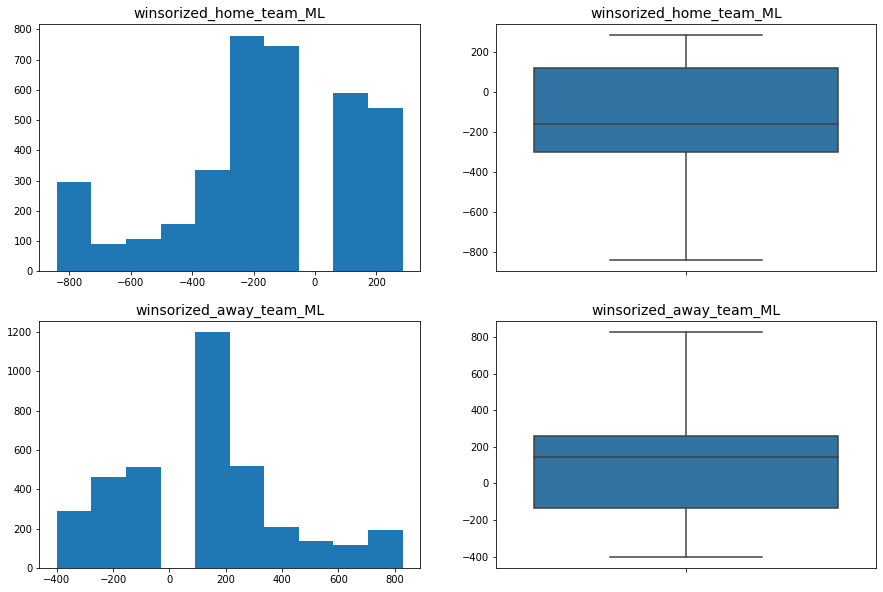

In [40]:
from winsor import winsorize_col

winsorize_col('home_team_ML', df)
winsorize_col('away_team_ML', df)

plt.figure(figsize=(15,10))

plt.subplot(2,2,1)
plt.hist(df['winsorized_home_team_ML'])
plt.title('winsorized_home_team_ML', fontsize=14)
plt.ylabel('')

plt.subplot(2,2,2)
sns.boxplot(y = df['winsorized_home_team_ML'])
plt.title('winsorized_home_team_ML', fontsize=14)
plt.ylabel('')

plt.subplot(2,2,3)
plt.hist(df['winsorized_away_team_ML'])
plt.title('winsorized_away_team_ML', fontsize=14)
plt.ylabel('')

plt.subplot(2,2,4)
sns.boxplot(y = df['winsorized_away_team_ML'])
plt.title('winsorized_away_team_ML', fontsize=14)
plt.ylabel('')


plt.show()

In [41]:
X = df[['home_team_spread', 'winsorized_away_team_ML', 'winsorized_home_team_ML',]]

X_std = StandardScaler().fit_transform(X)

pca = PCA(n_components=3)

X_pca = pca.fit_transform(X_std)

df['pca_ML_1'] = [x[0] for x in X_pca]
df['pca_ML_2'] = [x[1] for x in X_pca]
df['pca_ML_3'] = [x[2] for x in X_pca]

In [42]:
X = df[['pca_1', 'pca_2', 'pca_3', 'pca_4', 'pca_5', 'pca_6', 'pca_7', 'pca_8', 'pca_9', 'pca_10',
       'pca_11', 'pca_12', 'pca_13', 'pca_14', 'pca_15', 'pca_16', 'pca_17', 'pca_18', 'pca_19', 'pca_20',
       'pca_21', 'pca_22', 'pca_23', 'pca_24', 'pca_25', 'pca_26', 'pca_27', 'pca_28', 'pca_29', 'pca_30',
       'pca_31', 'pca_32', 'pca_33', 'pca_34', 'pca_35', 'pca_36', 'pca_37', 'pca_38', 'pca_39', 'pca_40',
       'pca_41', 'pca_42', 'pca_43', 'pca_44', 'pca_45', 'pca_46', 'pca_47', 'pca_48', 'pca_49', 'pca_50',
       'pca_ML_1', 'pca_ML_2', 'pca_ML_3']]

Y = df['winner']

# Dimension reduction techniques

# UMAP reduction

In [49]:
X_umap = umap.UMAP(n_neighbors=20, min_dist=1, metric='correlation').fit_transform(X)

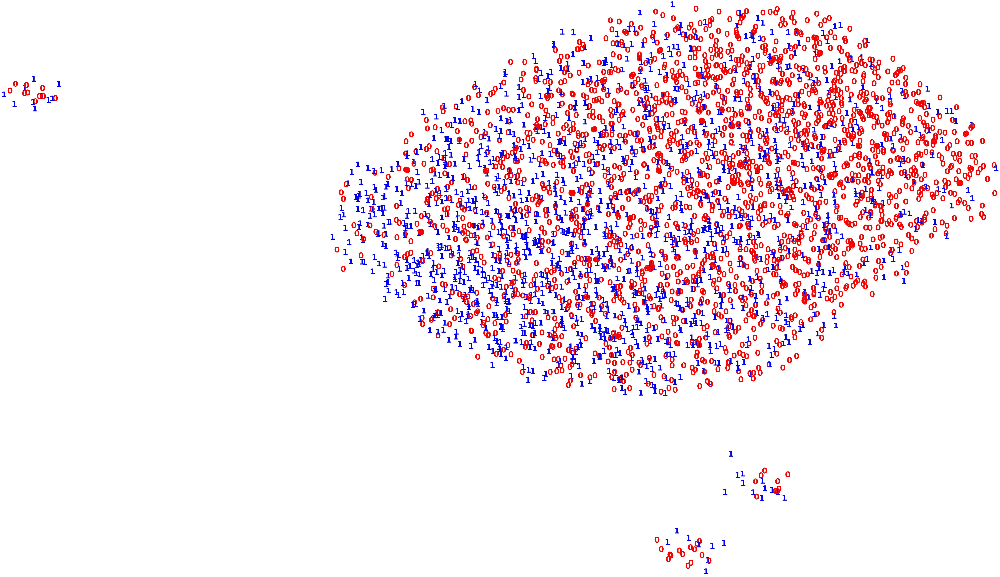

In [50]:
colours = ["r","b"]
for i in range(X_umap.shape[0]):
    plt.text(X_umap[i, 0], X_umap[i, 1], Y.iloc[i],
             color=colours[int(Y.iloc[i])],
             fontdict={'weight': 'bold', 'size': 50})

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

### Observations
- UMAP reduction was unable to seperate the winners from the losers.
- This is likely due to the fact that there no features that have a strong correlation with the winners or losers.

# PCA

In [51]:
pca = PCA(n_components=2)

X_pca = pca.fit_transform(X)

In [52]:
colours = ["r","b"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], Y.iloc[i],
             color=colours[int(Y.iloc[i])],
             fontdict={'weight': 'bold', 'size': 100})

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

### Observations
- Computationally least expensive
- Plot appears random. PCA was unable to seperate the winners from the losers.

# T-SNE reduction

In [53]:
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=500)

X_tsne = tsne.fit_transform(X)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 3634 samples in 0.017s...
[t-SNE] Computed neighbors for 3634 samples in 1.246s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3634
[t-SNE] Computed conditional probabilities for sample 2000 / 3634
[t-SNE] Computed conditional probabilities for sample 3000 / 3634
[t-SNE] Computed conditional probabilities for sample 3634 / 3634
[t-SNE] Mean sigma: 2.588135
[t-SNE] KL divergence after 250 iterations with early exaggeration: 80.615448
[t-SNE] KL divergence after 500 iterations: 2.651205


In [54]:
colours = ["r","b"]
for i in range(X_tsne.shape[0]):
    plt.text(X_tsne[i, 0], X_tsne[i, 1], Y.iloc[i],
             color=colours[int(Y.iloc[i])],
             fontdict={'weight': 'bold', 'size': 100})

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

### Observations
- Computationally very explensive
- The winners are losers seem randomly scattered
- Once again this is likely due to the fact that there no features that have a strong correlation with the winners or losers.

# Clustering models

# K-means

In [43]:
k_means = KMeans(n_clusters=2)

y_preds = k_means.fit_predict(X)

In [44]:
X_umap = umap.UMAP(n_neighbors=10, min_dist=1, metric='cosine').fit_transform(X)

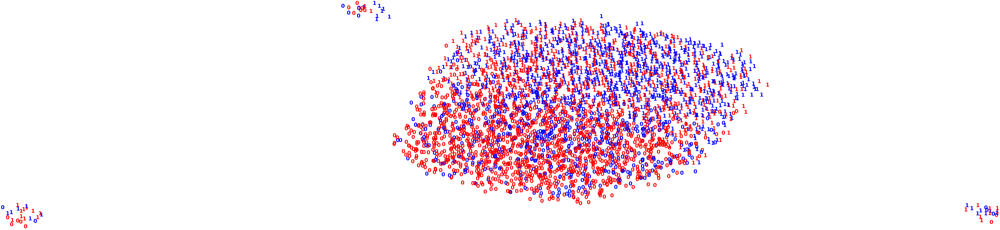

In [45]:
plt.figure(figsize=(5,2.5))
colours = 'rbg'
for i in range(X_umap.shape[0]):
    plt.text(X_umap[i, 0], X_umap[i, 1], str(y_preds[i]),
             color=colours[Y.iloc[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

## Summary of k-means model

In [46]:
print('ARI score: {}'.format(metrics.adjusted_rand_score(Y, y_preds)))
print('Silhouette score: {}'.format(metrics.silhouette_score(X, y_preds)))

ARI score: 0.06355809736139562
Silhouette score: 0.08770877504416358


In [47]:
matrix = pd.crosstab(Y, y_preds, margins=True)
accuracy = (matrix.loc[0,0] + matrix.loc[1,1]) / matrix.loc['All','All']
false_home_winner = matrix.loc[1,0] / matrix.loc['All',0]
false_away_winner = matrix.loc[0,1] / matrix.loc['All',1]

In [48]:
print('accuracy of k-means predictions: {}'.format(round(accuracy, 3)))
print('false home team winner predictions: {}'.format(round(false_home_winner, 3)))
print('false away team winner predictions: {}'.format(round(false_away_winner, 3)))

accuracy of k-means predictions: 0.626
false home team winner predictions: 0.292
false away team winner predictions: 0.457


# Agglomerative clustering

In [49]:
agg_clu = AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=2)
y_preds = agg_clu.fit_predict(X)

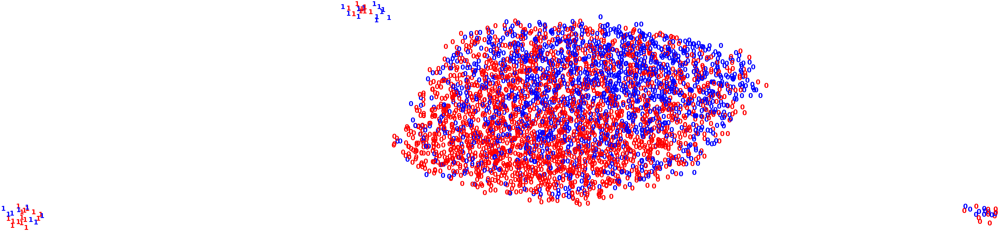

In [50]:
plt.figure(figsize=(4,2))
colours = 'rbg'
for i in range(X_umap.shape[0]):
    plt.text(X_umap[i, 0], X_umap[i, 1], str(y_preds[i]),
             color=colours[Y.iloc[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

## Summary of agglomerative model

In [51]:
print('ARI score: {}'.format(metrics.adjusted_rand_score(Y, y_preds)))
print('Silhouette score: {}'.format(metrics.silhouette_score(X, y_preds)))

ARI score: 0.000624406639469351
Silhouette score: 0.5875553092168758


In [52]:
matrix = pd.crosstab(Y, y_preds, margins=True)
accuracy = (matrix.loc[0,0] + matrix.loc[1,1]) / matrix.loc['All','All']
false_home_winner = matrix.loc[1,0] / matrix.loc['All',0]
false_away_winner = matrix.loc[0,1] / matrix.loc['All',1]
print('accuracy of agglomerative predictions: {}'.format(round(accuracy, 3)))
print('false home team winner predictions: {}'.format(round(false_home_winner, 3)))
print('false away team winner predictions: {}'.format(round(false_away_winner, 3)))

accuracy of agglomerative predictions: 0.583
false home team winner predictions: 0.415
false away team winner predictions: 0.545


# Guassian Mixture Model

In [53]:
gmm = GaussianMixture(n_components=2, covariance_type='full')

y_preds = gmm.fit_predict(X)

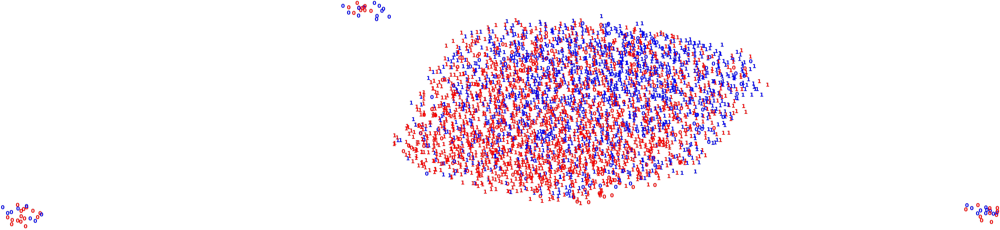

In [54]:
plt.figure(figsize=(5,2.5))
colours = 'rbg'
for i in range(X_umap.shape[0]):
    plt.text(X_umap[i, 0], X_umap[i, 1], str(y_preds[i]),
             color=colours[Y.iloc[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

# Summary of GMM

In [55]:
print('ARI score: {}'.format(metrics.adjusted_rand_score(Y, y_preds)))
print('Silhouette score: {}'.format(metrics.silhouette_score(X, y_preds)))

ARI score: 0.0010619969338984884
Silhouette score: 0.22396751002634382


In [56]:
matrix = pd.crosstab(Y, y_preds, margins=True)
accuracy = (matrix.loc[0,0] + matrix.loc[1,1]) / matrix.loc['All','All']
false_home_winner = matrix.loc[1,0] / matrix.loc['All',0]
false_away_winner = matrix.loc[0,1] / matrix.loc['All',1]

print('accuracy of GMM predictions: {}'.format(round(accuracy, 3)))
print('false home team winner predictions: {}'.format(round(false_home_winner, 3)))
print('false away team winner predictions: {}'.format(round(false_away_winner, 3)))

accuracy of GMM predictions: 0.433
false home team winner predictions: 0.425
false away team winner predictions: 0.585


# Summary of all clustering models
- All had very low ARI and silhouette scores
- All did not do a very good job clustering the winners and losers.
- Using the features available, it appears very difficult to predict the winners and losers.

# Supervised models for comparison

In [60]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=.2)

# Logistic Regression

In [61]:
lrc = LogisticRegression(solver='liblinear', penalty='l2')
lrc.fit(X_train, Y_train)

y_preds_train = lrc.predict(X_train)
y_preds_test = lrc.predict(X_test)

In [62]:
matrix = pd.crosstab(Y_train, y_preds_train, margins=True)
accuracy = (matrix.loc[0,0] + matrix.loc[1,1]) / matrix.loc['All','All']
false_home_winner = matrix.loc[1,0] / matrix.loc['All',0]
false_away_winner = matrix.loc[0,1] / matrix.loc['All',1]
print('accuracy of train predictions: {}'.format(round(accuracy, 3)))
print('false home team winner predictions: {}'.format(round(false_home_winner, 3)))
print('false away team winner predictions: {}'.format(round(false_away_winner, 3)))

matrix = pd.crosstab(Y_test, y_preds_test, margins=True)
accuracy = (matrix.loc[0,0] + matrix.loc[1,1]) / matrix.loc['All','All']
false_home_winner = matrix.loc[1,0] / matrix.loc['All',0]
false_away_winner = matrix.loc[0,1] / matrix.loc['All',1]
print('accuracy of test predictions: {}'.format(round(accuracy, 3)))
print('false home team winner predictions: {}'.format(round(false_home_winner, 3)))
print('false away team winner predictions: {}'.format(round(false_away_winner, 3)))

accuracy of train predictions: 0.678
false home team winner predictions: 0.306
false away team winner predictions: 0.353
accuracy of test predictions: 0.682
false home team winner predictions: 0.286
false away team winner predictions: 0.382


# Random Forest

In [65]:
rfc = RandomForestClassifier(n_estimators=500, max_depth=4)
rfc.fit(X_train, Y_train)

y_preds_train = rfc.predict(X_train)
y_preds_test = rfc.predict(X_test)

In [66]:
matrix = pd.crosstab(Y_train, y_preds_train, margins=True)
accuracy = (matrix.loc[0,0] + matrix.loc[1,1]) / matrix.loc['All','All']
false_home_winner = matrix.loc[1,0] / matrix.loc['All',0]
false_away_winner = matrix.loc[0,1] / matrix.loc['All',1]
print('accuracy of k-means predictions: {}'.format(round(accuracy, 3)))
print('false home team winner predictions: {}'.format(round(false_home_winner, 3)))
print('false away team winner predictions: {}'.format(round(false_away_winner, 3)))

matrix = pd.crosstab(Y_test, y_preds_test, margins=True)
accuracy = (matrix.loc[0,0] + matrix.loc[1,1]) / matrix.loc['All','All']
false_home_winner = matrix.loc[1,0] / matrix.loc['All',0]
false_away_winner = matrix.loc[0,1] / matrix.loc['All',1]
print('accuracy of k-means predictions: {}'.format(round(accuracy, 3)))
print('false home team winner predictions: {}'.format(round(false_home_winner, 3)))
print('false away team winner predictions: {}'.format(round(false_away_winner, 3)))

accuracy of k-means predictions: 0.727
false home team winner predictions: 0.285
false away team winner predictions: 0.243
accuracy of k-means predictions: 0.689
false home team winner predictions: 0.3
false away team winner predictions: 0.34


# Conclusion
- The unsupervised models had a difficult time clustering the winners and the losers. This is not surprising because even the best models find it very difficult to predict the winner and loser of a basetball game.
- The best unsupervised model in terms of predictions was the K-means model. The model predicted the winner correctly 63% of the time. This is worse than choosing the favored team to win every time. The ARI score was .06 and the silhouette score was .08.
- The supervised models accurately predicted much better than the unsupervised models. The random forest was the best model predicting with 69% accuracy. This is still not great, because it's about the same accuracy as predicting the favored team to win every time.

# Future works
- Identify other features that can better idenitfy the winners and losers.
- Experiment with oher models that could potnetially perform better.
- Hypertune the exising models.